# Hamiltonianos 

## Preambulo

In [2]:
using LinearAlgebra
using Plots

In [3]:
# Definición de las matrices de Pauli
id = [1.0 0; 0 1.0]
sigmax = [0 1.0; 1.0 0]
sigmay = [0 -im; im 0] 
sigmaz = [1.0 0; 0 -1.0]

2×2 Matrix{Float64}:
 1.0   0.0
 0.0  -1.0

In [4]:
#Así se define el producto tensorial
kron([sigmaz,id]...)

4×4 Matrix{Float64}:
 1.0  0.0   0.0   0.0
 0.0  1.0   0.0   0.0
 0.0  0.0  -1.0  -0.0
 0.0  0.0  -0.0  -1.0

In [5]:
sigmas = Dict(0=> id, 1=>sigmax, 2=>sigmay, 3=>sigmaz)

Dict{Int64, Matrix} with 4 entries:
  0 => [1.0 0.0; 0.0 1.0]
  2 => Complex{Int64}[0+0im 0-1im; 0+1im 0+0im]
  3 => [1.0 0.0; 0.0 -1.0]
  1 => [0.0 1.0; 1.0 0.0]

Se busca una función que dado un parametro $n$ que es el número de partículas y un dirección $x,y$ o $z$ en la que se mide el spin de la i-esima particula nos arroje $I\otimes I \otimes ... \otimes \sigma^i_{\{x,y,z\}} \otimes...\otimes I\otimes I$ donde $I$ aparece $n-1$ veces

In [6]:
# Definición del producto tensorial
function Pauli(indice, position, totalparticles)
    list = []
    for i in 1:totalparticles
        if i == position
            push!(list,sigmas[indice])
        else 
            push!(list,sigmas[0])
        end
    end
    return kron(list...)
end

Pauli (generic function with 1 method)

In [60]:
Pauli(1,3,4)

16×16 Matrix{Float64}:
 0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  1.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  1.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     1.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  

Razón de que se cruzaran antes, El hamiltoniano del modelo de Ising tiene la siguient simetría

$PHP=H$ donde $P=\prod_{i=1}^N \sigma_i^x = \bigotimes_{i=1}^N \sigma^x$ 

Se puede sacar los eigevectores para uno de los eigenvalores y luego se obtiene un nuevo hamiltoniano del tipo

$<v_n|H|v_m>$

## Función del Operador de Paridad

In [7]:
function parity(particles)
    list = [sigmas[1] for _ in 1:particles]
    return kron(list...)
end

parity (generic function with 1 method)

## Experimentación con el operador

In [8]:
parity(4)

16×16 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  1.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  1.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  1.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  1.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  1.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  1.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     1.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  

In [9]:
vals, vecs = eigen(parity(4))

Eigen{Float64, Float64, Matrix{Float64}, Vector{Float64}}
values:
16-element Vector{Float64}:
 -0.9999999999999989
 -0.9999999999999989
 -0.9999999999999989
 -0.9999999999999989
 -0.9999999999999989
 -0.9999999999999989
 -0.9999999999999989
 -0.9999999999999989
  1.0
  1.0
  1.0
  1.0
  1.0
  1.0
  1.0
  1.0
vectors:
16×16 Matrix{Float64}:
  0.0        0.0        0.0        0.0       …  0.0       0.0       0.707107
  0.707107   0.0        0.0        0.0          0.0       0.0       0.0
  0.0        0.0        0.0        0.0          0.707107  0.0       0.0
  0.0        0.707107   0.0        0.0          0.0       0.0       0.0
  0.0        0.0        0.0        0.0          0.0       0.0       0.0
  0.0        0.0        0.707107   0.0       …  0.0       0.0       0.0
  0.0        0.0        0.0        0.0          0.0       0.0       0.0
  0.0        0.0        0.0        0.707107     0.0       0.707107  0.0
  0.0        0.0        0.0       -0.707107     0.0       0.707107  0.0
  0.0

Si este operador es una simetría del Hamiltoniano, podemos diagonalizar el Hamiltoniano por bloques de paridad.

In [10]:
# Para filtrar todos los eigenvectores con eigenvalor 1, hacemos lo siguiente para encontrar los índices
@show findall(vals .== 1)

findall(vals .== 1) = [9, 10, 11, 12, 13, 14, 15, 16]


8-element Vector{Int64}:
  9
 10
 11
 12
 13
 14
 15
 16

In [11]:
#O simplemente dentro de la matriz de eigenvectores
vec = vecs[:, findall(vals .< 0)]

16×8 Matrix{Float64}:
  0.0        0.0        0.0       …   0.0        0.0       -0.707107
  0.707107   0.0        0.0           0.0        0.0        0.0
  0.0        0.0        0.0           0.0       -0.707107   0.0
  0.0        0.707107   0.0           0.0        0.0        0.0
  0.0        0.0        0.0          -0.707107   0.0        0.0
  0.0        0.0        0.707107  …   0.0        0.0        0.0
  0.0        0.0        0.0           0.0        0.0        0.0
  0.0        0.0        0.0           0.0        0.0        0.0
  0.0        0.0        0.0           0.0        0.0        0.0
  0.0        0.0        0.0           0.0        0.0        0.0
  0.0        0.0       -0.707107  …   0.0        0.0        0.0
  0.0        0.0        0.0           0.707107   0.0        0.0
  0.0       -0.707107   0.0           0.0        0.0        0.0
  0.0        0.0        0.0           0.0        0.707107   0.0
 -0.707107   0.0        0.0           0.0        0.0        0.0
  0.0        

In [12]:
vec = vecs[:, findall(vals .> 0)]

16×8 Matrix{Float64}:
 0.0       0.0       0.0       0.0       …  0.0       0.0       0.707107
 0.707107  0.0       0.0       0.0          0.0       0.0       0.0
 0.0       0.0       0.0       0.0          0.707107  0.0       0.0
 0.0       0.0       0.0       0.0          0.0       0.0       0.0
 0.0       0.0       0.0       0.707107     0.0       0.0       0.0
 0.0       0.0       0.707107  0.0       …  0.0       0.0       0.0
 0.0       0.707107  0.0       0.0          0.0       0.0       0.0
 0.0       0.0       0.0       0.0          0.0       0.707107  0.0
 0.0       0.0       0.0       0.0          0.0       0.707107  0.0
 0.0       0.707107  0.0       0.0          0.0       0.0       0.0
 0.0       0.0       0.707107  0.0       …  0.0       0.0       0.0
 0.0       0.0       0.0       0.707107     0.0       0.0       0.0
 0.0       0.0       0.0       0.0          0.0       0.0       0.0
 0.0       0.0       0.0       0.0          0.707107  0.0       0.0
 0.707107  0.0       

# Ejercicios

## 1 

*   Diagonalizar por bloques el Hamiltoniano de Ising con Js aleatorias. Es decir, teniendo los eigenvectores con un eigenvalor de paridad determinado, digamos $\{|v_i>\}$, donde $P|v_i>=|v_i>$, el bloque del Hamiltoniano es simplemente $H^+_{ij}=<v_i|H|v_j>$, donde el $+$ indica que es el bloque con paridad positiva.
*   Graficar de nuevo el espectro respecto al campo $b$, pero ahora con los eigenvalores de diferente paridad con diferente color (claramente tendremos solo dos colores).

## Modelo de Ising 

$H=-J\sum_i \sigma_i \sigma_{i+1} -h \sum_i S_i$

In [13]:
# En un campo externo h 
function Ising(N,J,h; cerrada = false) #Keyword Arguments
    H = 0
    totalparticulas = N
    if cerrada == false 
        M = (N - 1)
    elseif cerrada == true 
        M = N 
    end

    for i in 0:(M-1)
        H = H .+ J*(Pauli(3, mod(i,N),totalparticulas)*Pauli(3,mod((i+1),N),totalparticulas))
    end
    for j in 0:N-1
        H = H .+ h*Pauli(1,j,totalparticulas)
    end
    return H 
end

Ising (generic function with 1 method)

## Experimentos

In [14]:
N = 3 # Número de partículas 
J = 0.5 #interacción entre partículas
b_values = 0:0.01:1 # rango para el campo externo
list = []
for b in b_values
     Ham = Ising(N,J,b,cerrada = false)
     Vals = eigen(Ham).values
     append!(list,map(x->[b,x],Vals))
end

In [15]:
list
x_list = [l[1] for l in list]
y_list = [l[2] for l in list]

808-element Vector{Float64}:
 -1.0
 -1.0
  0.0
  0.0
  0.0
  0.0
  1.0
  1.0
 -0.9901500037464347
 -0.9901500037464319
  ⋮
  3.160810351628923
 -1.188901059316731
 -1.1889010593167275
  0.5431497482521439
  0.5431497482521466
  1.4568502517478579
  1.4568502517478592
  3.1889010593167333
  3.188901059316734

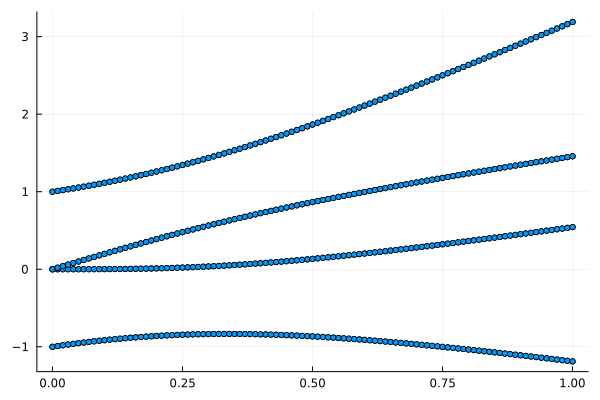

In [16]:
scatter(x_list,y_list, label = false, markersize = 3)
# Con el campo se rompe la simetría esférica (se rompe la degeneración)
# Las trayectorias de eigenvalores no deberían cruzarse pero no es tán evidente para algunos casos

## Ising Random

$H=-\sum_i J_i \sigma_i^z \sigma_{i+1}^z+b\sum \sigma_i^x$ tal que $J_i \sim U([1-\epsilon, 1+\epsilon])$ y $z\sim U([0,1])$

In [17]:
function Ising_Random(N,h, j_vec; cerrada = false) #Keyword Arguments
    H = 0
    totalparticulas = N
    if cerrada == false 
        M = (N - 1)
    elseif cerrada == true 
        M = N 
    end
    
    for i in 0:(M-1)
        H = H .+ j_vec[i+1]*(Pauli(3, mod(i,N),totalparticulas)*Pauli(3,mod((i+1),N),totalparticulas))
    end
    for j in 0:N-1
        H = H .+ h*Pauli(1,j+1,totalparticulas)
    end
    return H 
end

Ising_Random (generic function with 1 method)

## Experimentos

In [18]:
ϵ = 0.1
N = 4
j_vec = rand(N)*2*ϵ .-ϵ .+ 1 #Por pasos: primero rand() da un número entre 0 y 1, 
#luego se multiplica por 2*ϵ y esto da un número entre 0 y 2ϵ,
# se le resta ϵ y esto da un número entre -ϵ y ϵ,
#, finalmente se le suma 1 y esto da un número entre 1-ϵ y 1+ϵ :)
Ising_Random(N,1.0,j_vec; cerrada = false)

16×16 Matrix{Float64}:
 2.97126  1.0      1.0      0.0       1.0      …   0.0      0.0      0.0
 1.0      2.97126  0.0      1.0       0.0          0.0      0.0      0.0
 1.0      0.0      1.01672  1.0       0.0          0.0      0.0      0.0
 0.0      1.0      1.0      1.01672   0.0          0.0      0.0      0.0
 1.0      0.0      0.0      0.0      -0.88916      0.0      0.0      0.0
 0.0      1.0      0.0      0.0       1.0      …   1.0      0.0      0.0
 0.0      0.0      1.0      0.0       1.0          0.0      1.0      0.0
 0.0      0.0      0.0      1.0       0.0          0.0      0.0      1.0
 1.0      0.0      0.0      0.0       0.0          0.0      0.0      0.0
 0.0      1.0      0.0      0.0       0.0          1.0      0.0      0.0
 0.0      0.0      1.0      0.0       0.0      …   0.0      1.0      0.0
 0.0      0.0      0.0      1.0       0.0          0.0      0.0      1.0
 0.0      0.0      0.0      0.0       1.0          1.0      1.0      0.0
 0.0      0.0      0.0      

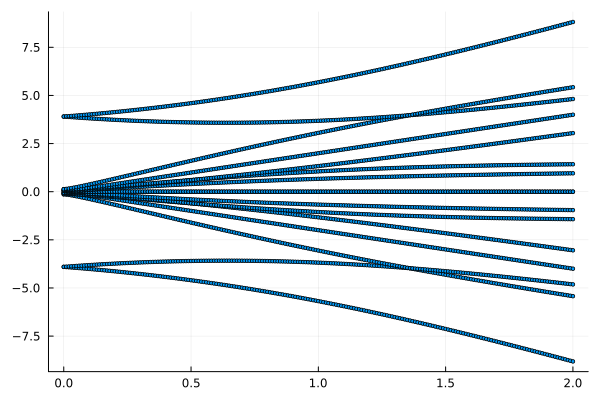

In [19]:
list = []
for h in 0:0.01:2
     ham = Ising_Random(N,h,j_vec,cerrada = true)
     Vals = eigen(ham).values
     append!(list,map(x->[h,x],Vals))
end

list
x_list_random = [l[1] for l in list]
y_list_random = [l[2] for l in list]

scatter(x_list_random,y_list_random, label = false, markersize = 2)

## Ising Random in parity basis

In [20]:
# Función para proyectar el Hamiltoniano en la base de paridad
function project_hamiltonian(H, particles, sign)
    vals, vecs = eigen(parity(particles))
    H_proy = zeros(2^(particles-1),2^(particles-1))	

    # Bloques correspondientes a eigenvalores positivos y negativos
    if sign == 1
        vec = vecs[:, findall(vals .> 0)]
        elseif sign == -1
            vec = vecs[:, findall(vals .< 0)]
    end

    for i in 1:size(vec)[2]
        for j in 1:size(vec)[2]
            H_proy[i,j] = vec[:,i]' * H * vec[:,j]
        end
    end

    return H_proy
end

project_hamiltonian (generic function with 1 method)

## Experimentos

In [21]:
H= Ising_Random(N, 0.5, j_vec)
project_hamiltonian(H, N, 1)

8×8 Matrix{Float64}:
 1.93021  0.5         0.5       0.0      …   0.0        0.0        0.5
 0.5      0.0243327   0.0       0.5          0.5        0.5        0.0
 0.5      0.0        -1.93021   0.5          0.5        0.5        0.0
 0.0      0.5         0.5      -1.93021      0.0        0.0        0.5
 0.5      0.0         0.0       0.5          0.5        0.5        0.0
 0.0      0.5         0.5       0.0      …  -0.0243327  0.0        0.5
 0.0      0.5         0.5       0.0          0.0        0.0243327  0.5
 0.5      0.0         0.0       0.5          0.5        0.5        1.93021

In [22]:
project_hamiltonian(H, N, -1)

8×8 Matrix{Float64}:
  1.93021   0.5         0.5      …   0.0       0.0        -0.5
  0.5      -0.0243327   0.0          0.5      -0.5         0.0
  0.5       0.0        -1.93021     -0.5       0.5         0.0
  0.0       0.5         0.5          0.0       0.0         0.5
  0.5       0.0         0.0          0.5       0.5         0.0
  0.0       0.5        -0.5      …  -1.93021   0.0         0.5
  0.0      -0.5         0.5          0.0      -0.0243327   0.5
 -0.5       0.0         0.0          0.5       0.5         1.93021

In [23]:
list = []
for h in 0:0.01:2
     ham = Ising_Random(N,h,j_vec,cerrada = true)
     Ham_proy = project_hamiltonian(ham, N, 1)
     Vals = eigen(Ham_proy).values
     append!(list,map(x->[h,x],Vals))
end

In [24]:
list
x_list_random = [l[1] for l in list]
y_list_random = [l[2] for l in list]

1608-element Vector{Float64}:
 -1.9302116987442126
 -1.9302116987442113
 -0.024332726859421484
 -0.024332726859421415
  0.024332726859421415
  0.024332726859421484
  1.9302116987442113
  1.9302116987442126
 -1.9403423095723755
 -1.920340162224183
  ⋮
  8.19386996303902
 -8.232704304161855
 -1.4668626902302524
 -1.2343063774745655
 -0.0001479914061793059
  0.0001479914061958868
  1.2343063774745637
  1.466862690230248
  8.232704304161874

In [25]:
list2 = []
for h in 0:0.01:2
     ham = Ising_Random(N,h,j_vec,cerrada = true)
     Ham_proy = project_hamiltonian(ham, N, -1)
     Vals = eigen(Ham_proy).values
     append!(list2,map(x->[h,x],Vals))
end

In [26]:
list2
x_list_random2 = [l[1] for l in list2]
y_list_random2 = [l[2] for l in list2]

1608-element Vector{Float64}:
 -1.9302116987442126
 -1.9302116987442113
 -0.024332726859421484
 -0.024332726859421415
  0.024332726859421415
  0.024332726859421484
  1.9302116987442113
  1.9302116987442126
 -1.9403401622241816
 -1.9203423095723746
  ⋮
  5.44730512741743
 -5.466862690230253
 -4.23270430416187
 -4.000147991406181
 -2.7656936225254354
  2.7656936225254345
  4.00014799140619
  4.232704304161875
  5.466862690230257

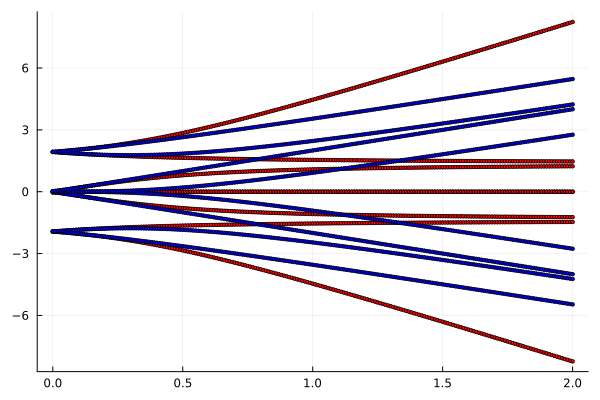

In [27]:
scatter(x_list_random,y_list_random, color =:red, label = false, markersize = 2)
scatter!(x_list_random2,y_list_random2, color =:blue, label = false, markersize = 2)

## 2

*   Definir el operador de traslación de qubits. Es decir, considerando una cadena cerrada, definan el operador $K$ tal que $K|000100>=|000010>$, etc. La idea de este operador es que las etiquetas de los qubits se mapen, por ejemplo, de la siguiente forma $i \rightarrow i+1$. 
La cantidad conservada se llama cuasimomento

## Funciones auxiliares

In [20]:
# Primero definimos algunas funciones auxiliares que nos ayudarán a convertir de un número a una lista de bits y viceversa.
function original_integer(list)
    return parse(Int, join(list); base=2)
end

function base_2(integer; pad= nothing)
    if pad == nothing
        return reverse(digits(integer, base = 2))
    else
        return reverse(digits(integer, base = 2, pad = pad))
    end
end

base_2 (generic function with 1 method)

In [21]:
original_integer([0,0,0,1,0,0])

4

In [22]:
original_integer([0,0,0,0,1,0])

2

## K Transformation

In [31]:
function rotate(index, particles)
    vec = base_2(index, pad = particles)
    return original_integer([vec[end]; vec[1:end-1]])
end

rotate (generic function with 1 method)

In [32]:
base_2(4, pad = 6)

6-element Vector{Int64}:
 0
 0
 0
 1
 0
 0

In [33]:
# ejemplo:
# toma el 0 =[0] y lo manda al [0]=0 de modo que la primera columna debe tener un 1 en la fila 0
#toma el 1 = [001] y lo debe de mandar a [100]=4 de modo que la segunda columna de la matriz
#debe tener 1 en la fila 4 
function operator_K(particulas)
    size = 2^particulas
    K = zeros(Int, size, size)
    
    for i in 0:(size-1)
        K[rotate(i,particulas)+1, i+1] = 1
    end
    return K
end

k = operator_K(3)

8×8 Matrix{Int64}:
 1  0  0  0  0  0  0  0
 0  0  1  0  0  0  0  0
 0  0  0  0  1  0  0  0
 0  0  0  0  0  0  1  0
 0  1  0  0  0  0  0  0
 0  0  0  1  0  0  0  0
 0  0  0  0  0  1  0  0
 0  0  0  0  0  0  0  1

## Experiementos

In [34]:
eigen_vals, eigen_vecs = eigen(k)

Eigen{ComplexF64, ComplexF64, Matrix{ComplexF64}, Vector{ComplexF64}}
values:
8-element Vector{ComplexF64}:
 -0.5000000000000004 - 0.8660254037844395im
 -0.5000000000000004 - 0.8660254037844395im
 -0.5000000000000004 + 0.8660254037844395im
 -0.5000000000000004 + 0.8660254037844395im
  0.9999999999999998 + 0.0im
  0.9999999999999998 + 0.0im
                 1.0 + 0.0im
                 1.0 + 0.0im
vectors:
8×8 Matrix{ComplexF64}:
      0.0-0.0im        0.0-0.0im  …      0.0+0.0im  1.0+0.0im  0.0+0.0im
      0.0-0.0im  -0.288675+0.5im     0.57735+0.0im  0.0+0.0im  0.0+0.0im
      0.0-0.0im    0.57735-0.0im     0.57735+0.0im  0.0+0.0im  0.0+0.0im
 0.288675+0.5im        0.0-0.0im         0.0+0.0im  0.0+0.0im  0.0+0.0im
      0.0-0.0im  -0.288675-0.5im     0.57735+0.0im  0.0+0.0im  0.0+0.0im
 -0.57735-0.0im        0.0-0.0im  …      0.0+0.0im  0.0+0.0im  0.0+0.0im
 0.288675-0.5im        0.0-0.0im         0.0+0.0im  0.0+0.0im  0.0+0.0im
      0.0-0.0im        0.0-0.0im         0.0+0.0im  0.0+

## Función para determinar eigenvalores unicos de un operador

In [35]:
# Define a tolerance for floating-point comparisons
tolerance = 1e-8

# Custom function to check if two complex numbers are approximately equal
function is_approx_equal(x, y)
    return norm(x - y) < tolerance
end

# Filter unique values using the custom comparison
function custom_unique(list)
    rounded_vals = round.(list, digits=10)
    filtered_vals = []
    for v in rounded_vals
        if all(!is_approx_equal(v, fv) for fv in filtered_vals)
            push!(filtered_vals, v)
        end
    end
    return filtered_vals
end

custom_unique (generic function with 1 method)

In [36]:
final_vals_unique = custom_unique(eigen_vals)

3-element Vector{Any}:
 -0.5 - 0.8660254038im
 -0.5 + 0.8660254038im
  1.0 + 0.0im

## Ising homogeneo 

In [37]:
# Ising homogeneo
function Ising_homogeneo(N,J,h; cerrada = false) #Keyword Arguments
    H = 0
    totalparticulas = N
    if cerrada == false 
        M = (N - 1)
    elseif cerrada == true 
        M = N 
    end

    for i in 0:(M-1)
        H = H .+ J*(Pauli(3, mod(i,N),totalparticulas)*Pauli(3,mod((i+1),N),totalparticulas))
    end
    for j in 0:N-1
        H = H .+ h*Pauli(1,j,totalparticulas)
    end
    return H 
end

Ising_homogeneo (generic function with 1 method)

In [38]:
Ising_hom = Ising_homogeneo(3,0.5,0.5)

8×8 Matrix{Float64}:
 1.5  0.0  0.5  0.0   0.5   0.0  0.0  0.0
 0.0  1.5  0.0  0.5   0.0   0.5  0.0  0.0
 0.5  0.0  0.5  0.0   0.0   0.0  0.5  0.0
 0.0  0.5  0.0  0.5   0.0   0.0  0.0  0.5
 0.5  0.0  0.0  0.0  -0.5   0.0  0.5  0.0
 0.0  0.5  0.0  0.0   0.0  -0.5  0.0  0.5
 0.0  0.0  0.5  0.0   0.5   0.0  0.5  0.0
 0.0  0.0  0.0  0.5   0.0   0.5  0.0  0.5

## Ising Homogeneo en la base de K

In [39]:
# Función para proyectar el Hamiltoniano en la base de K
function project_hamiltonian_K(H, particles, eigenvalor_que_indexa_el_bloque)
    
    vals, vecs = eigen(operator_K(particles))
    rounded_vals = round.(vals, digits=10)
   
    final_vals_unique = custom_unique(vals) #lista con los eigenvalores distintos

    columnas_dic = Dict()
    eigen_dict = Dict()
    for i in 1:length(final_vals_unique)
        eigen_dict[i] = final_vals_unique[i]
        columnas_dic[i] = length(findall(rounded_vals .== final_vals_unique[i]))
    end

    if !haskey(eigen_dict, eigenvalor_que_indexa_el_bloque)
        error("El diccionario de eigenvlores no contiene el idice seleccionado pruebe con uno menor")
    end    
    n=columnas_dic[eigenvalor_que_indexa_el_bloque]
    H_proy = zeros(Complex{Float64}, n, n)	#el numero de columnas será la multiplicidad del eigenvalor 

    # Bloques correspondientes a eigenvalores
    vec = vecs[:, findall(rounded_vals .== eigen_dict[eigenvalor_que_indexa_el_bloque])]

    for i in 1:size(vec, 2)
        for j in 1:size(vec, 2)
            H_proy[i, j] = vec[:, i]' * H * vec[:, j]
        end
    end

    return H_proy
end

project_hamiltonian_K (generic function with 1 method)

## Experimentos

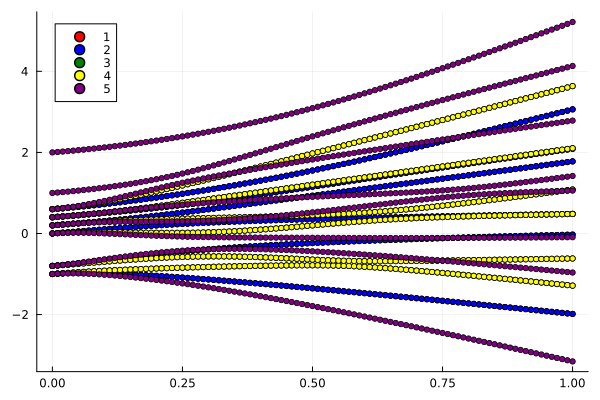

In [40]:
#Parametros
Particulas = 5
J = 0.5

# Inicializar listas para almacenar los resultados
list1_5 = []
list2_5 = []
list3_5 = []
list4_5 = []
list5_5 = []

# Rango para el campo externo
for b in 0:0.01:1
    Ising_hom = Ising_homogeneo(Particulas, J, b, cerrada = false)
    
    # Proyectar el Hamiltoniano para los tres índices en eigen_dic
    H_proy_K1 = project_hamiltonian_K(Ising_hom, Particulas, 1)
    H_proy_K2 = project_hamiltonian_K(Ising_hom, Particulas, 2)
    H_proy_K3 = project_hamiltonian_K(Ising_hom, Particulas, 3)
    H_proy_K4 = project_hamiltonian_K(Ising_hom, Particulas, 4)
    H_proy_K5 = project_hamiltonian_K(Ising_hom, Particulas, 5)

    # Obtener los valores propios
    Vals1 = eigen(H_proy_K1).values
    Vals2 = eigen(H_proy_K2).values
    Vals3 = eigen(H_proy_K3).values
    Vals4 = eigen(H_proy_K4).values
    Vals5 = eigen(H_proy_K5).values
    
    # Agregar los valores a las listas correspondientes
    append!(list1_5, map(x -> [b, x], Vals1))
    append!(list2_5, map(x -> [b, x], Vals2))
    append!(list3_5, map(x -> [b, x], Vals3))
    append!(list4_5, map(x -> [b, x], Vals4))
    append!(list5_5, map(x -> [b, x], Vals5))
end

# Extraer las coordenadas x e y de las listas
x_list1_5 = [l[1] for l in list1_5]
y_list1_5 = [l[2] for l in list1_5]

x_list2_5 = [l[1] for l in list2_5]
y_list2_5 = [l[2] for l in list2_5]

x_list3_5 = [l[1] for l in list3_5]
y_list3_5 = [l[2] for l in list3_5]

x_list4_5 = [l[1] for l in list4_5]
y_list4_5 = [l[2] for l in list4_5]

x_list5_5 = [l[1] for l in list5_5]
y_list5_5 = [l[2] for l in list5_5]

# Graficar los tres conjuntos de datos en la misma figura
scatter(real(x_list1_5), real(y_list1_5), color = :red, label = "1", markersize = 3)
scatter!(real(x_list2_5), real(y_list2_5), color = :blue, label = "2", markersize = 3)
scatter!(real(x_list3_5), real(y_list3_5), color = :green, label = "3", markersize = 3)
scatter!(real(x_list4_5), real(y_list4_5), color = :yellow, label = "4", markersize = 3)
scatter!(real(x_list5_5), real(y_list5_5), color = :purple, label = "5", markersize = 3)

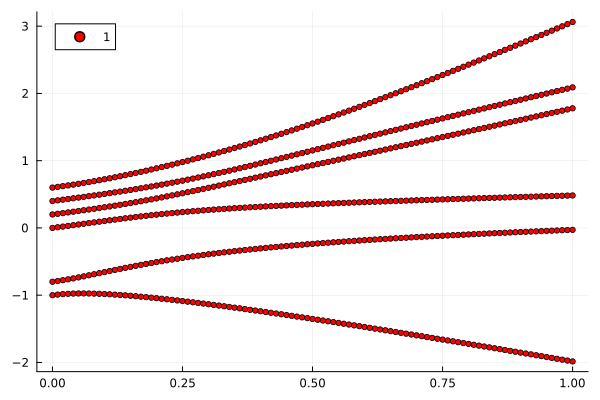

In [41]:
scatter(real(x_list1_5), real(y_list1_5), color = :red, label = "1", markersize = 3)

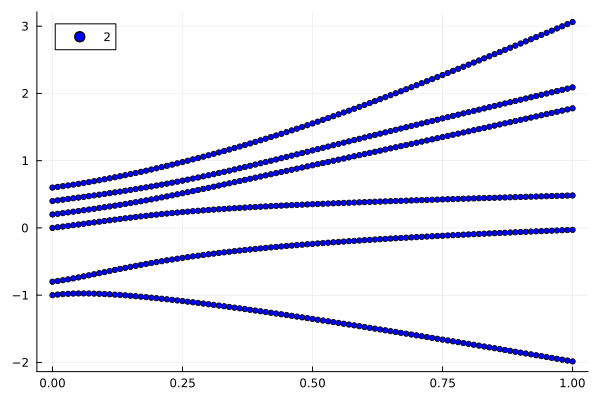

In [42]:
scatter(real(x_list2_5), real(y_list2_5), color = :blue, label = "2", markersize = 3)

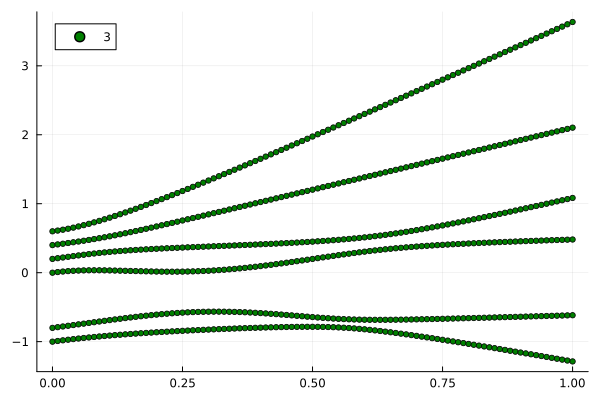

In [43]:
scatter(real(x_list3_5), real(y_list3_5), color = :green, label = "3", markersize = 3)

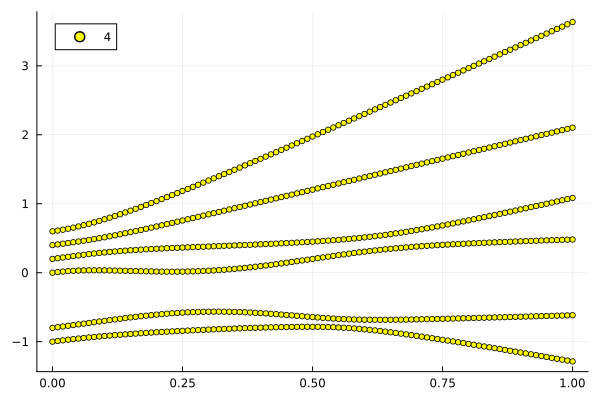

In [44]:
scatter(real(x_list4_5), real(y_list4_5), color = :yellow, label = "4", markersize = 3)

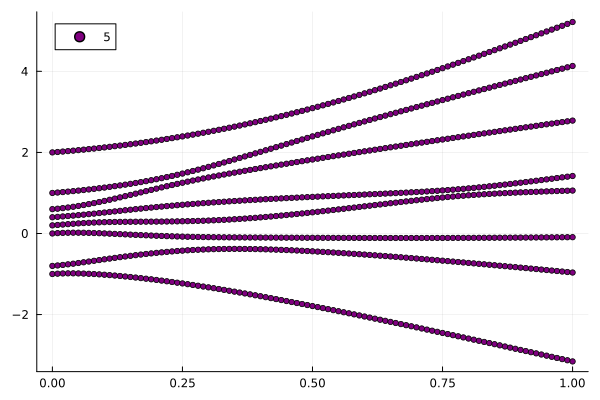

In [45]:
scatter(real(x_list5_5), real(y_list5_5), color = :purple, label = "5", markersize = 3)

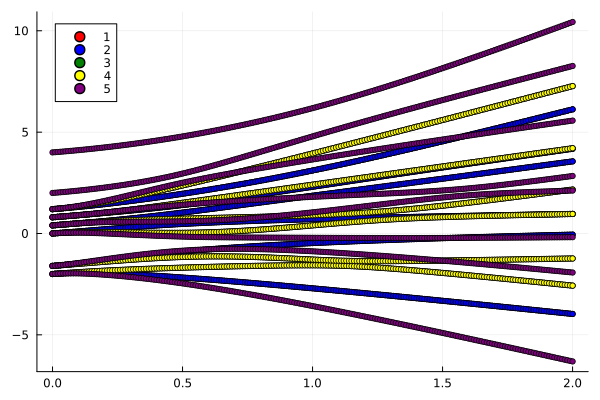

In [46]:
#Parametros
Particulas = 5
J = 1

# Inicializar listas para almacenar los resultados
list1_5_1 = []
list2_5_1 = []
list3_5_1 = []
list4_5_1 = []
list5_5_1 = []

# Rango para el campo externo
for b in 0:0.01:2
    Ising_hom_1 = Ising_homogeneo(Particulas, J, b, cerrada = false)
    
    # Proyectar el Hamiltoniano para los tres índices en eigen_dic
    H_proy_K1_1 = project_hamiltonian_K(Ising_hom_1, Particulas, 1)
    H_proy_K2_1 = project_hamiltonian_K(Ising_hom_1, Particulas, 2)
    H_proy_K3_1 = project_hamiltonian_K(Ising_hom_1, Particulas, 3)
    H_proy_K4_1 = project_hamiltonian_K(Ising_hom_1, Particulas, 4)
    H_proy_K5_1 = project_hamiltonian_K(Ising_hom_1, Particulas, 5)

    # Obtener los valores propios
    Vals1_1 = eigen(H_proy_K1_1).values
    Vals2_1 = eigen(H_proy_K2_1).values
    Vals3_1 = eigen(H_proy_K3_1).values
    Vals4_1 = eigen(H_proy_K4_1).values
    Vals5_1 = eigen(H_proy_K5_1).values
    
    # Agregar los valores a las listas correspondientes
    append!(list1_5_1, map(x -> [b, x], Vals1_1))
    append!(list2_5_1, map(x -> [b, x], Vals2_1))
    append!(list3_5_1, map(x -> [b, x], Vals3_1))
    append!(list4_5_1, map(x -> [b, x], Vals4_1))
    append!(list5_5_1, map(x -> [b, x], Vals5_1))
end

# Extraer las coordenadas x e y de las listas
x_list1_5_1 = [l[1] for l in list1_5_1]
y_list1_5_1 = [l[2] for l in list1_5_1]

x_list2_5_1 = [l[1] for l in list2_5_1]
y_list2_5_1 = [l[2] for l in list2_5_1]

x_list3_5_1 = [l[1] for l in list3_5_1]
y_list3_5_1 = [l[2] for l in list3_5_1]

x_list4_5_1 = [l[1] for l in list4_5_1]
y_list4_5_1 = [l[2] for l in list4_5_1]

x_list5_5_1 = [l[1] for l in list5_5_1]
y_list5_5_1 = [l[2] for l in list5_5_1]

# Graficar los tres conjuntos de datos en la misma figura
scatter(real(x_list1_5_1), real(y_list1_5_1), color = :red, label = "1", markersize = 3)
scatter!(real(x_list2_5_1), real(y_list2_5_1), color = :blue, label = "2", markersize = 3)
scatter!(real(x_list3_5_1), real(y_list3_5_1), color = :green, label = "3", markersize = 3)
scatter!(real(x_list4_5_1), real(y_list4_5_1), color = :yellow, label = "4", markersize = 3)
scatter!(real(x_list5_5_1), real(y_list5_5_1), color = :purple, label = "5", markersize = 3)

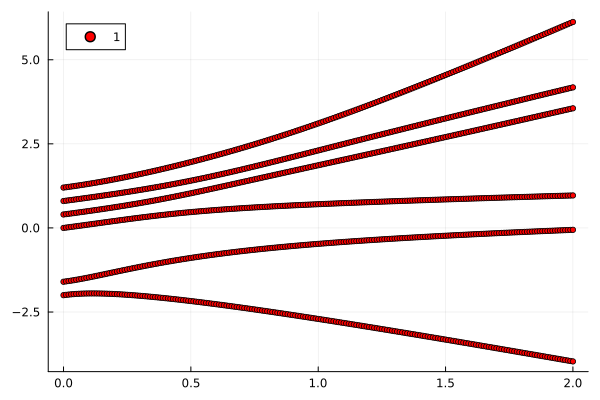

In [47]:
scatter(real(x_list1_5_1), real(y_list1_5_1), color = :red, label = "1", markersize = 3)

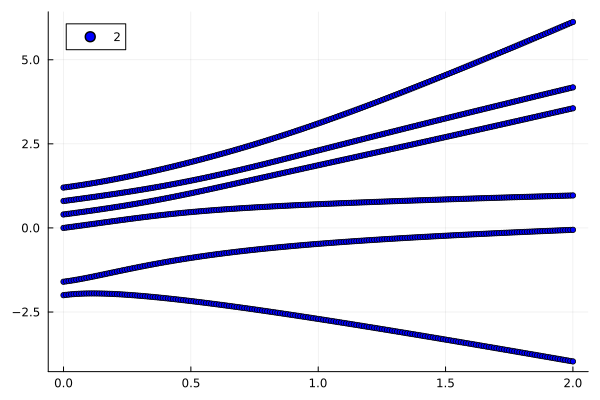

In [48]:
scatter(real(x_list2_5_1), real(y_list2_5_1), color = :blue, label = "2", markersize = 3)

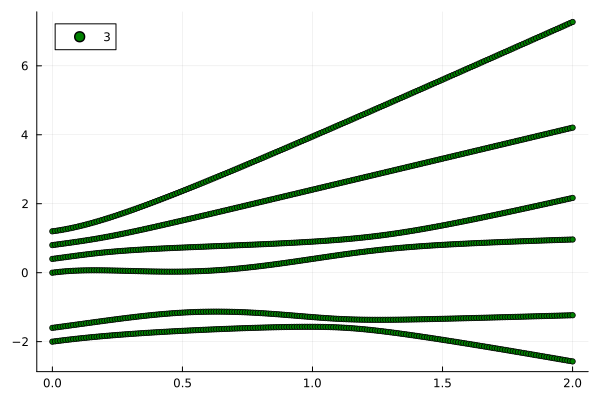

In [49]:
scatter(real(x_list3_5_1), real(y_list3_5_1), color = :green, label = "3", markersize = 3)

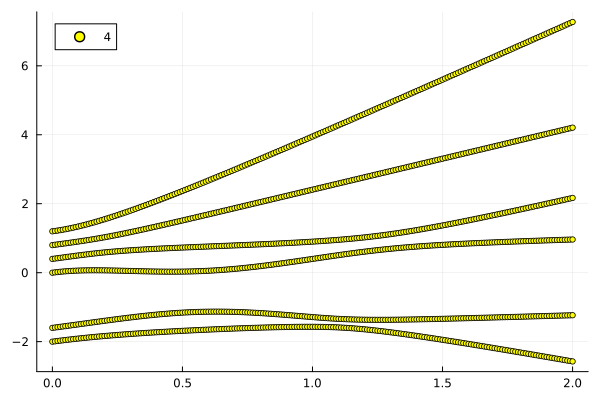

In [50]:
scatter(real(x_list4_5_1), real(y_list4_5_1), color = :yellow, label = "4", markersize = 3)

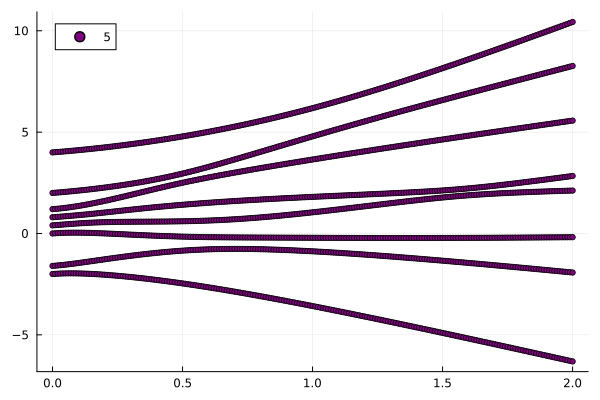

In [51]:
scatter(real(x_list5_5_1), real(y_list5_5_1), color = :purple, label = "5", markersize = 3)

In [52]:
list1 = []
for b in 0:0.01:1 # rango para el campo externo
     Ising_hom = Ising_homogeneo(3,0.5,b,cerrada = false)
     H_proy_K = project_hamiltonian_K(Ising_hom, 3, 1)
     Vals = eigen(H_proy_K).values
     append!(list1,map(x->[b,x],Vals))
end

In [53]:
list2 = []
for b in 0:0.01:1 # rango para el campo externo
     Ising_hom = Ising_homogeneo(3,0.5,b,cerrada = false)
     H_proy_K = project_hamiltonian_K(Ising_hom, 3, 2)
     Vals = eigen(H_proy_K).values
     append!(list2,map(x->[b,x],Vals))
end

In [54]:
list3 = []
for b in 0:0.01:1 # rango para el campo externo
     Ising_hom = Ising_homogeneo(3,0.5,b,cerrada = false)
     H_proy_K = project_hamiltonian_K(Ising_hom, 3, 3)
     Vals = eigen(H_proy_K).values
     append!(list3,map(x->[b,x],Vals))
end

In [55]:
list1
x_list1 = [l[1] for l in list1]
y_list1 = [l[2] for l in list1]

202-element Vector{Number}:
   -0.33333333333333354 + 0.0im
 -4.163336342344337e-17 + 0.0im
                       -0.3234666133759576
                        0.010133280042624013
                       -0.31386581605312625
                        0.020532482719792678
     -0.304529044160189 - 1.0709565703706529e-18im
   0.031195710826855592 + 2.035948323822497e-19im
   -0.29545318534896237 + 3.4859249052040297e-19im
    0.04211985201562884 + 5.516255874073743e-17im
                        ⋮
      1.454678763330228 + 4.333906091648747e-17im
                        0.135534295032472
                        1.4711323716341949
                        0.13907654084087206
                        1.4875901258257949
                        0.14261475875366353
                        1.5040519079130035
                        0.14614906239705672
                        1.5205176042696102

In [56]:
list2
x_list2 = [l[1] for l in list2]
y_list2 = [l[2] for l in list2]

202-element Vector{Number}:
   -0.33333333333333354 + 0.0im
 -4.163336342344337e-17 + 0.0im
                       -0.3234666133759576
                        0.010133280042624013
                       -0.31386581605312625
                        0.020532482719792678
     -0.304529044160189 + 1.0709565703706529e-18im
   0.031195710826855592 - 2.035948323822497e-19im
   -0.29545318534896237 - 3.4859249052040297e-19im
    0.04211985201562884 - 5.516255874073743e-17im
                        ⋮
      1.454678763330228 - 4.333906091648747e-17im
                        0.135534295032472
                        1.4711323716341949
                        0.13907654084087206
                        1.4875901258257949
                        0.14261475875366353
                        1.5040519079130035
                        0.14614906239705672
                        1.5205176042696102

In [57]:
list3
x_list3 = [l[1] for l in list3]
y_list3 = [l[2] for l in list3]

404-element Vector{Number}:
   -0.3333333333333337 + 0.0im
                   0.0 + 0.0im
 3.885780586188048e-16 + 0.0im
                   1.0 + 0.0im
                      -0.3242642264713417
                       0.009938124797764882
                       0.01085943500691053
                       1.0101333333333327
                      -0.31702823764226207
                       0.01975255931050818
                       ⋮
                       3.0801513386540202
                      -1.0577422200977025
                       0.5934158695963432
                       1.9827153956199057
                       3.108277621548132
                      -1.0672597175440086
                       0.5974776846479171
                       2.0000000000000027
                       3.1364486995627665

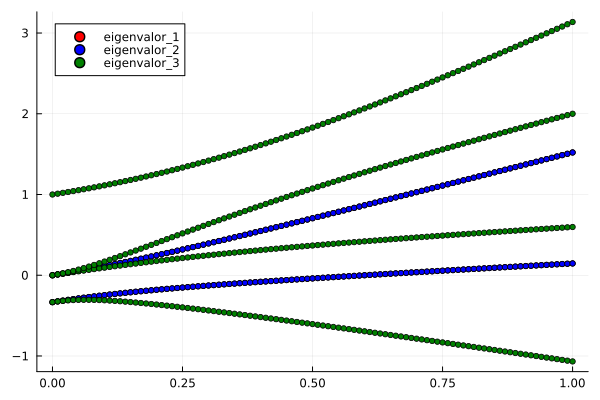

In [58]:
# Graficar solo la parte real de los datos
scatter(real(x_list1), real(y_list1), color = :red, label = "eigenvalor_1", markersize = 3)
scatter!(real(x_list2), real(y_list2), color = :blue, label = "eigenvalor_2", markersize = 3)
scatter!(real(x_list3), real(y_list3), color = :green, label = "eigenvalor_3", markersize = 3)

# Ejercicios
## 1
Crear la función `merge_two_integers` utilizando los operadores bit-wise mostrados arriba.
Testear la función y asegurarse de que funcione correctamente.

https://geekmonkey.org/lwm-julia-bitwise-operators/
https://dojo.qulacs.org/en/latest/notebooks/1.3_multiqubit_representation_and_operations.html

La idea es la siguiente: tenemos un sistema de $n$ qubits tal que el estado del sistema está dado por

$$|\psi>=\sum_{i_1,...,i_n} c_{i_1,i_2,...,i_n}|i_1,i_2,...i_n>$$

En el caso de 2 qubits por ejemplo 

$$|\psi> = c_{00}|00> + c_{01}|01> + c_{10} |10> + c_{11}|11>$$

Y queremos aplicar un operador unitario al k-esimo quibit, es decir $U = I\otimes \;... \otimes U_{k} \otimes \; ... \otimes I$

$$U|\psi> = \sum_{i_1,...,i_n} c_{i_1,i_2,...,i_n}|i_1>\otimes \;...\otimes U_{k}|i_k>\otimes \;...\otimes |i_n>$$

In [34]:
mask = original_integer([0,1,1,0,0])
a = original_integer([1,1])
b = original_integer([1,0,1])
mask, a , b

(12, 3, 5)

In [35]:
original_integer([1,1,1,0,1])

29

In [36]:

function merge_two_integers_1(mask, a, b)
# Notemos que 1 en binario será [...,0,0,0,1] por lo que 
# [...,i_3,i_2,i_1,i_0] & 1 solo puede ser 0 o 1 según i_0 sea 1 o 0
    max_len = length(base_2(a))+length(base_2(b)) #numero de particulas
    result = 0

    for n in 0:max_len
        if mask & 1 == 1
            bit = a & 1
            result = result | bit << n
            mask = mask >> 1
            a = a >> 1
            bit = bit >> 1
        elseif mask & 1 == 0
            bit = b & 1
            result = result | bit << n
            mask = mask >> 1
            b = b >> 1
            bit = bit >> 1
        end
    end
    return result
end

merge_two_integers_1 (generic function with 1 method)

In [37]:
merge_two_integers_1(168, 5, 43)

411

Una posible solución sería contar cual el la maxima posición del 1 a la izquierda y de ahí se puede calcular el pad 
`max(pos(a_bit,1), pos(b_bit,1), pos(mask_bit,1))=max_pos=pad`

In [38]:
function merge_two_integers_2(mask::Int, a::Int, b::Int, qubits::Int)
    mask_bits = base_2(mask, pad=qubits)
    a_bits = base_2(a, pad=qubits)
    b_bits = base_2(b, pad=qubits)
    
    result_bits = Vector{Int}(undef, qubits)
    a_idx = length(a_bits)
    b_idx = length(b_bits)
    
    for i in qubits:-1:1
        if mask_bits[i] == 1
            result_bits[i] = a_idx > 0 ? a_bits[a_idx] : 0
            a_idx -= 1
        else
            result_bits[i] = b_idx > 0 ? b_bits[b_idx] : 0
            b_idx -= 1
        end
    end
    
    return original_integer(result_bits)
end 

merge_two_integers_2 (generic function with 1 method)

In [39]:
function merge_two_integers(a::Int, b::Int, mask::Int)::Int
    result = 0
    bit_position = 0

    while mask != 0 || a != 0 || b != 0
        if mask & 1 == 1
            result |= (a & 1) << bit_position
            a >>= 1
        else
            result |= (b & 1) << bit_position
            b >>= 1
        end
        mask >>= 1
        bit_position += 1
    end

    return result
end

merge_two_integers (generic function with 1 method)

In [40]:
# Ejemplo
result = merge_two_integers_2(168, 5, 43, 9)

411

In [41]:
m = base_2(168)
x = base_2(5)
y = base_2(43)
m,x,y

([1, 0, 1, 0, 1, 0, 0, 0], [1, 0, 1], [1, 0, 1, 0, 1, 1])

## 2
Crear una función que se llame `apply_qubit_unitary(u,target,particles)` utilizando `merge_two_integers`. Esta nueva función deberá aplicar una unitaria de $2 \times 2$ al qubit target.

In [42]:
function apply_qubit_unitary(u::Matrix{ComplexF64}, target::Int, qubits::Int)
    if size(u) != (2, 2)
        error("La matriz unitaria debe ser de tamaño 2x2")
    end

    I2 = I(2)  # Matriz identidad de 2x2
    U_total = I(1)  # Inicializamos con identidad de dimensión 1x1

    for q in 1:qubits
        if q == target
            U_total = kron(U_total, u)  # Aplicamos la unidad en la posición del target
        else
            U_total = kron(U_total, I2)  # Identidad en los demás qubits
        end
    end
    return U_total
end
# Ejemplo de uso
X = [0 1; 1 0]  # Puerta Pauli-X
X_complex = ComplexF64.(X)
U = apply_qubit_unitary(X_complex, 2, 3)  # Aplica X al segundo qubit en un sistema de 3 qubits

8×8 Matrix{ComplexF64}:
 0.0+0.0im  0.0+0.0im  1.0+0.0im  …  0.0+0.0im  0.0+0.0im  0.0+0.0im
 0.0+0.0im  0.0+0.0im  0.0+0.0im     0.0+0.0im  0.0+0.0im  0.0+0.0im
 1.0+0.0im  0.0+0.0im  0.0+0.0im     0.0+0.0im  0.0+0.0im  0.0+0.0im
 0.0+0.0im  1.0+0.0im  0.0+0.0im     0.0+0.0im  0.0+0.0im  0.0+0.0im
 0.0+0.0im  0.0+0.0im  0.0+0.0im     0.0+0.0im  1.0+0.0im  0.0+0.0im
 0.0+0.0im  0.0+0.0im  0.0+0.0im  …  0.0+0.0im  0.0+0.0im  1.0+0.0im
 0.0+0.0im  0.0+0.0im  0.0+0.0im     0.0+0.0im  0.0+0.0im  0.0+0.0im
 0.0+0.0im  0.0+0.0im  0.0+0.0im     1.0+0.0im  0.0+0.0im  0.0+0.0im

La idea es aplicar un operador unitario $U$ en el quibit `target` en un sistema de $n$ qubits tal que la función dependa de $U$, el qubit `tarjet`, $n$ y el estado del sistema. Por ejemplo si tenemos el estado

In [43]:
function apply_unitary(U, state, target)
    #el qubit target tienen que ser 2^i donde se tiene el i-esimo qubit
    dim_target = 2
    dim_untouched = div(length(state),2)
    new_state = zeros(length(state))
    for unt in 0:dim_untouched-1
        pos = [merge_two_integers(i,unt,target)+1 for i in 0:dim_target-1]
        new_state[pos]=U*state[pos]
    end
    return new_state
end

apply_unitary (generic function with 1 method)

In [ ]:
n = 4 #numero de qubits
ψ = rand(2^n)

16-element Vector{Float64}:
 0.8172803723087668
 0.3981182245048459
 0.5292762389880588
 0.3179285832618888
 0.17484659145979198
 0.8305557194890484
 0.5946114936042826
 0.14930276491786387
 0.9849934854314022
 0.037495088453477265
 0.10038047446251042
 0.18296409239613998
 0.6406123979145184
 0.5036999489503188
 0.25291069699229807
 0.9772843223359687

In [69]:
dim_untouched=div(length(ψ),2)

8

In [46]:
apply_unitary(sigmas[1], ψ, 2)

16-element Vector{Float64}:
 0.5292762389880588
 0.3179285832618888
 0.8172803723087668
 0.3981182245048459
 0.5946114936042826
 0.14930276491786387
 0.17484659145979198
 0.8305557194890484
 0.10038047446251042
 0.18296409239613998
 0.9849934854314022
 0.037495088453477265
 0.25291069699229807
 0.9772843223359687
 0.6406123979145184
 0.5036999489503188

In [62]:
Pauli(1,3,4)*ψ

16-element Vector{Float64}:
 0.5292762389880588
 0.3179285832618888
 0.8172803723087668
 0.3981182245048459
 0.5946114936042826
 0.14930276491786387
 0.17484659145979198
 0.8305557194890484
 0.10038047446251042
 0.18296409239613998
 0.9849934854314022
 0.037495088453477265
 0.25291069699229807
 0.9772843223359687
 0.6406123979145184
 0.5036999489503188